# Name: Dushyanth.Kumar.H
Batch: 23rd April batch
Project Name: Chemical Property Modelling in association UltraTech Cement Limited                                            
	and Aditya Birla Group


# Phase3: Creation of the initial dataset 

1.What all data cleaning and preprocessing techniques you can apply on dataset? Write the theory of it in points.

The following Data cleaning and preprocessing techniques can be used on the dataset

Handling Missing Values:
        I will start by checking for missing values in each column to identify which columns have missing data.
Depending on the extent of missing data. 
I will decide whether to remove rows with missing values or impute the missing values based on the context of my analysis.

Outlier Detection and Treatment:
        I will visually inspect the data using box plots, scatter plots, or statistical methods to identify outliers in each numerical column.
I will consider whether to remove or transform outliers. For example, I might cap extreme values or winsorize them.

Data Scaling and Normalization:
        I'll closely examine numerical columns like "Material Quantity (gm)" and "Water Mix (ml)" to determine if they need scaling. If necessary, I'll standardize or normalize them to ensure consistent scales.

Feature Selection:
        I will assess the relevance of each column for my analysis. I'll consider removing columns that may not contribute significantly to my analysis, thus simplifying the dataset.

Data Transformation:
        I'll examine the distribution of numerical columns. If any of them have skewed distributions, I'll consider applying transformations like logarithmic or exponential transformations to make them more suitable for modeling.

Handling Imbalanced Data:
        If my dataset has a target variable (e.g., "Compression Strength MPa") and the classes are imbalanced, I will consider resampling techniques to balance the classes for more robust modeling.

Time Series Preprocessing (if applicable):
        If my data represents time series information, I'll preprocess it by resampling or differencing to make the data stationary if needed.

Data Splitting:
        I'll split my dataset into training, validation, and test sets. The specific proportions will depend on my modeling needs, but common splits include 70-30, 80-20, or 60-20-20 for train, validation, and test, respectively.

Data Normalization:
        I'll normalize numerical columns as needed, ensuring that my choice of normalization method aligns with the requirements of the machine learning algorithms I plan to use.

Data Aggregation (if applicable):
        If my dataset represents time series data and is too granular, I'll consider aggregating data over specific time intervals to reduce its size and 
        complexity.

Feature Engineering:
        I will explore the possibility of creating new features or extracting meaningful information from existing columns to enhance the predictive power of my model.

In [1]:
#importing the necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

In [2]:
#Loading the data
df=pd.read_csv(r'C:\Users\DUSHY\OneDrive\Desktop\ask\Material Compressive Strength Experimental Data (1).csv')

In [3]:
#getting to know the data
df.head()

,Material Quantity (gm),Additive Catalyst (gm),Ash Component (gm),Water Mix (ml),Plasticizer (gm),Moderate Aggregator,Refined Aggregator,Formulation Duration (hrs),Compression Strength MPa
0,486.42,180.60,21.26,201.66,16.11,1151.17,708.50,344.43,79.89
1,133.32,260.14,185.60,175.99,6.27,1090.57,1010.25,28.86,59.80
2,559.97,2.84,111.76,295.23,11.95,1024.93,810.69,237.68,77.86
3,391.43,351.05,76.39,299.14,19.00,1134.88,881.34,208.81,71.74
4,394.78,352.61,194.35,235.54,17.02,1098.24,781.01,266.84,76.07


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6139 entries, 0 to 6138
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Material Quantity (gm)      6030 non-null   float64
 1   Additive Catalyst (gm)      6030 non-null   float64
 2   Ash Component (gm)          6030 non-null   float64
 3   Water Mix (ml)              6030 non-null   float64
 4   Plasticizer (gm)            6030 non-null   float64
 5   Moderate Aggregator         6030 non-null   float64
 6   Refined Aggregator          6030 non-null   float64
 7   Formulation Duration (hrs)  6030 non-null   float64
 8   Compression Strength MPa    6139 non-null   float64
dtypes: float64(9)
memory usage: 431.8 KB


In [5]:
df.isnull().sum()

Material Quantity (gm)        109
Additive Catalyst (gm)        109
Ash Component (gm)            109
Water Mix (ml)                109
Plasticizer (gm)              109
Moderate Aggregator           109
Refined Aggregator            109
Formulation Duration (hrs)    109
Compression Strength MPa        0
dtype: int64

In [6]:
df.describe()

,Material Quantity (gm),Additive Catalyst (gm),Ash Component (gm),Water Mix (ml),Plasticizer (gm),Moderate Aggregator,Refined Aggregator,Formulation Duration (hrs),Compression Strength MPa
count,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000,6139.000000
mean,383.642297,196.699846,111.856252,224.296955,17.651085,998.669332,811.832398,174.408504,56.851430
std,149.994316,133.329220,74.241117,41.545751,11.687965,97.732677,112.813539,112.415173,16.124932
min,124.440000,0.000000,0.000000,148.600000,0.000000,821.540000,609.230000,16.250000,2.610000
25%,256.030000,78.210000,44.582500,190.387500,7.922500,918.437500,717.447500,70.300000,47.085000
50%,377.405000,192.320000,115.250000,225.700000,16.345000,997.985000,810.260000,163.105000,59.790000
75%,511.522500,307.650000,174.257500,257.447500,27.667500,1079.827500,905.857500,272.602500,69.845000
max,658.800000,438.470000,244.120000,301.340000,39.280000,1174.360000,1018.050000,380.250000,92.510000


***Handling missing/null values

<Axes: >

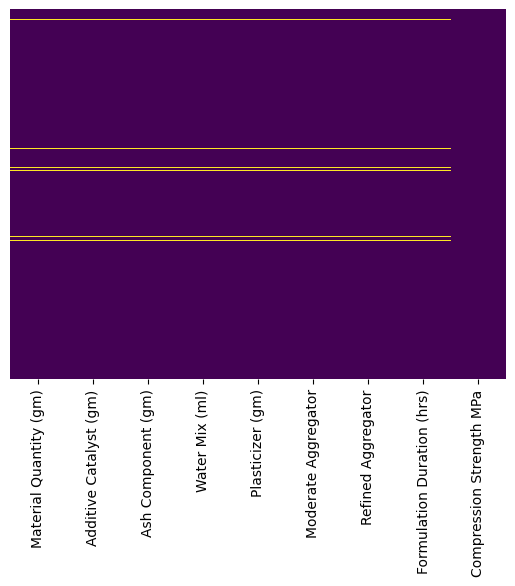

In [7]:
#visualizing null valuesin dataset using seaborn
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap="viridis")

By visually veryifing the dataset through heatmap all columns except comprression strength have null values in the same rows.And there are 6139 rows in which 109 rows are null values which is 1.7% of the total rows which is a significantly a small percentage. Hence dropping the null values from the dataframe

In [8]:
#removing the null rows
null_subset=['Material Quantity (gm)', 'Additive Catalyst (gm)',
       'Ash Component (gm)', 'Water Mix (ml)', 'Plasticizer (gm)',
       'Moderate Aggregator', 'Refined Aggregator',
       'Formulation Duration (hrs)']
df= df.dropna(subset=null_subset)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6030 entries, 0 to 6138
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Material Quantity (gm)      6030 non-null   float64
 1   Additive Catalyst (gm)      6030 non-null   float64
 2   Ash Component (gm)          6030 non-null   float64
 3   Water Mix (ml)              6030 non-null   float64
 4   Plasticizer (gm)            6030 non-null   float64
 5   Moderate Aggregator         6030 non-null   float64
 6   Refined Aggregator          6030 non-null   float64
 7   Formulation Duration (hrs)  6030 non-null   float64
 8   Compression Strength MPa    6030 non-null   float64
dtypes: float64(9)
memory usage: 471.1 KB


***Outlier Detection and Treatment

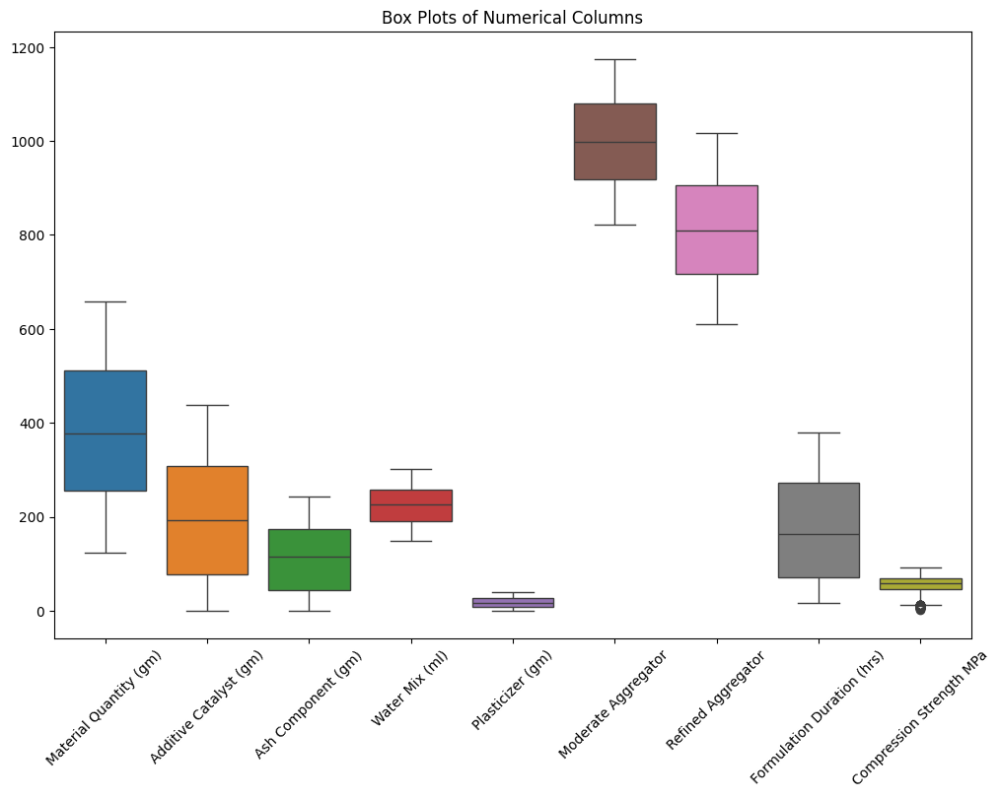

In [10]:
numerical_columns = df.select_dtypes(include=['float64'])
plt.figure(figsize=(12, 8))
sns.boxplot(data=numerical_columns)
plt.title('Box Plots of Numerical Columns')
plt.xticks(rotation=45)
plt.show()

There are no outliers in the numerical columns. 

***Using the DataFrame.applymap() Function:

In [11]:
# Defining a custom cleaning function
def clean_element(element):
    if isinstance(element, str) and '%' in element:
        # If the element is a string containing '%', remove '%' and convert to float
        element = float(element.replace('%', ''))
    return element

# Apply the cleaning function to the entire DataFrame element-wise
df_cleaned = df.applymap(clean_element)

print(df_cleaned)

      Material Quantity (gm)  Additive Catalyst (gm)  Ash Component (gm)  \
0                     486.42                  180.60               21.26   
1                     133.32                  260.14              185.60   
2                     559.97                    2.84              111.76   
3                     391.43                  351.05               76.39   
4                     394.78                  352.61              194.35   
...                      ...                     ...                 ...   
6134                  188.78                  162.30              142.65   
6135                  349.87                  291.45               77.82   
6136                  358.29                   22.70               17.99   
6137                  445.25                  275.59              178.86   
6138                  560.23                  266.56              167.14   

      Water Mix (ml)  Plasticizer (gm)  Moderate Aggregator  \
0             201.66    

C:\Users\DUSHY\AppData\Local\Temp\ipykernel_19688\2183781828.py:9: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_cleaned = df.applymap(clean_element)


***Normalization and Standardization:

Creating copies of datasets and applying normalization and standardization on each of them separately for further use

In [12]:
# Create a copy of the original DataFrame
df_minmax = df.copy()
df_standard = df.copy()

# Create a MinMaxScaler
minmax_scaler = MinMaxScaler()

# Normalize the columns of interest for the Min-Max scaled dataset
df_minmax['Material Quantity (gm)'] = minmax_scaler.fit_transform(df_minmax[['Material Quantity (gm)']])
df_minmax['Water Mix (ml)'] = minmax_scaler.fit_transform(df_minmax[['Water Mix (ml)']])

# Create a StandardScaler
standard_scaler = StandardScaler()

# Standardize the columns of interest for the Standardization scaled dataset
df_standard['Material Quantity (gm)'] = standard_scaler.fit_transform(df_standard[['Material Quantity (gm)']])
df_standard['Water Mix (ml)'] = standard_scaler.fit_transform(df_standard[['Water Mix (ml)']])

# Phase4: Exploratory Data Analysis

Exploring each independent feature w.r.t. dependent variable (Compression Strength):

Using Histograms

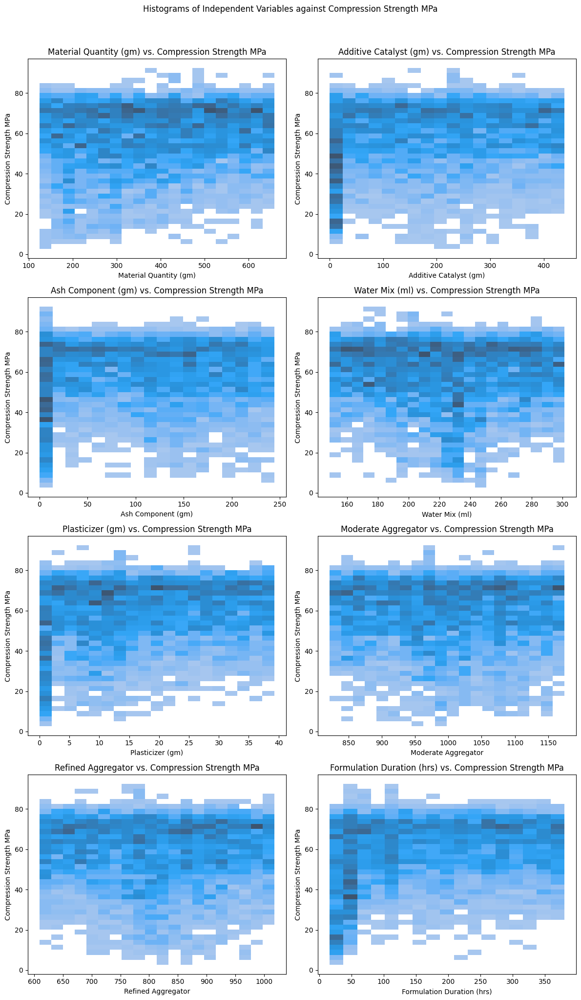

In [13]:
#Creating Histogram for each independent variables wrt to Compression Strength
independent_variables = ['Material Quantity (gm)', 'Additive Catalyst (gm)', 'Ash Component (gm)', 
                          'Water Mix (ml)', 'Plasticizer (gm)', 'Moderate Aggregator', 
                          'Refined Aggregator', 'Formulation Duration (hrs)']

dependent_variable = 'Compression Strength MPa'

# Set up subplots
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 20))
fig.suptitle(f'Histograms of Independent Variables against {dependent_variable}', y=1.02)
axes = axes.flatten()

# Plot each scatter plot
for i, variable in enumerate(independent_variables):
    sns.histplot(x=variable, y=dependent_variable, data=df, ax=axes[i])
    axes[i].set_title(f'{variable} vs. {dependent_variable}')

# Adjust layout
plt.tight_layout()
plt.show()

# Uni variant analysis

Using Histograms with KDE

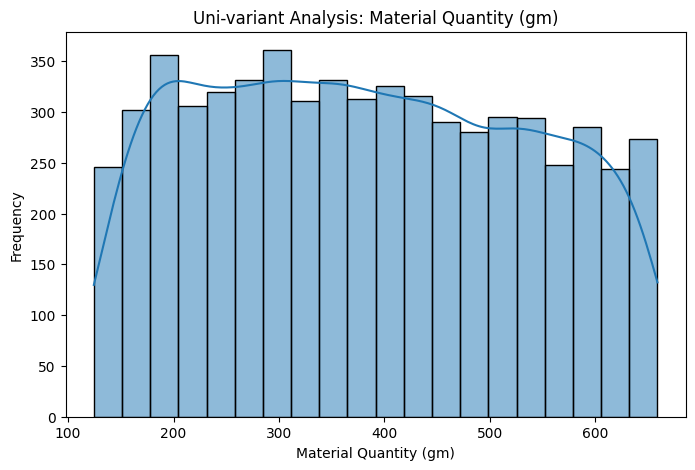

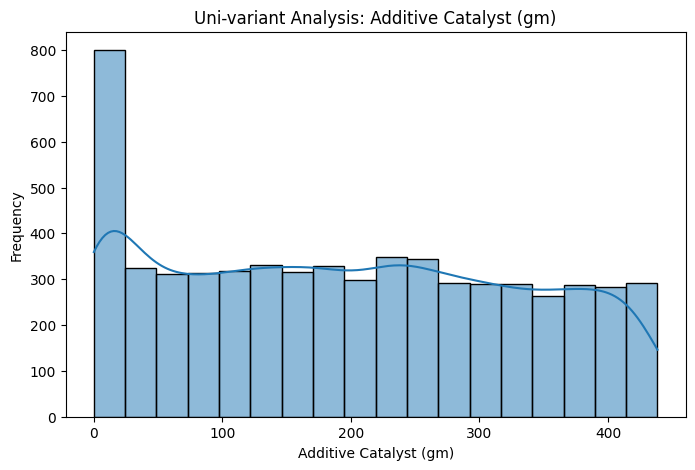

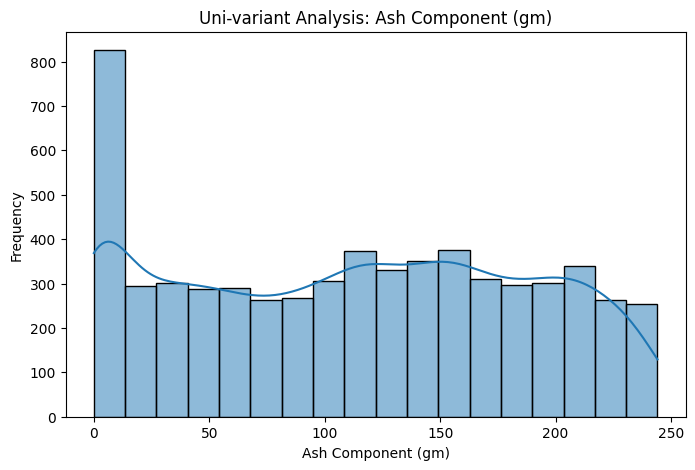

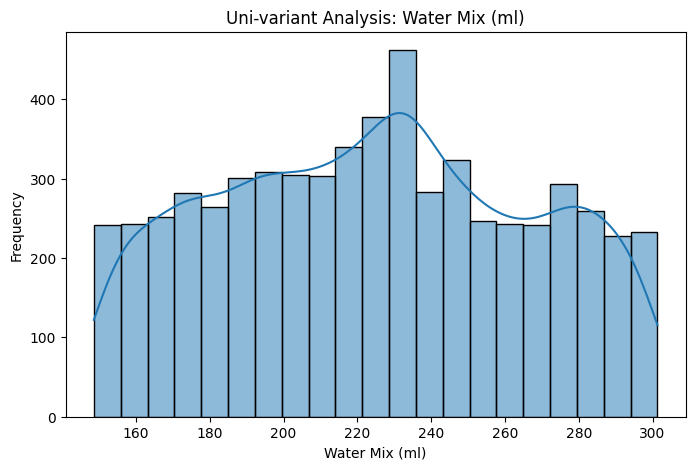

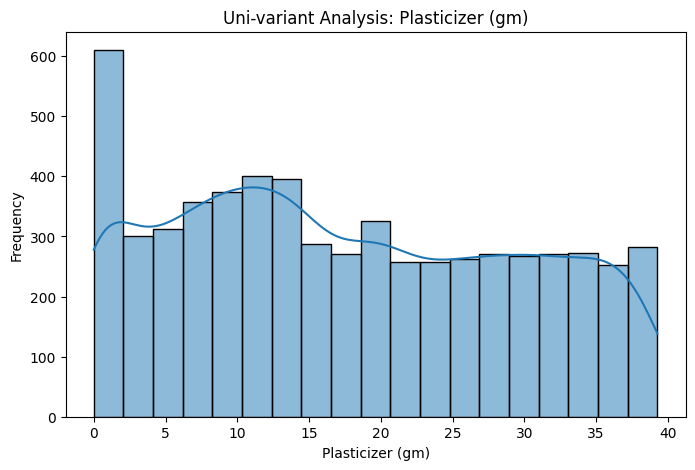

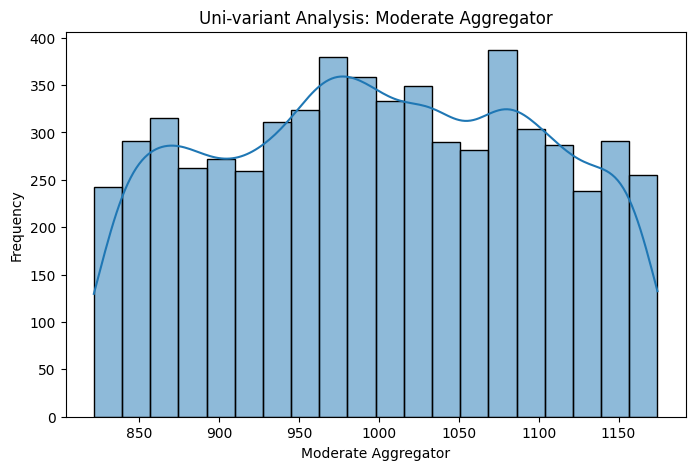

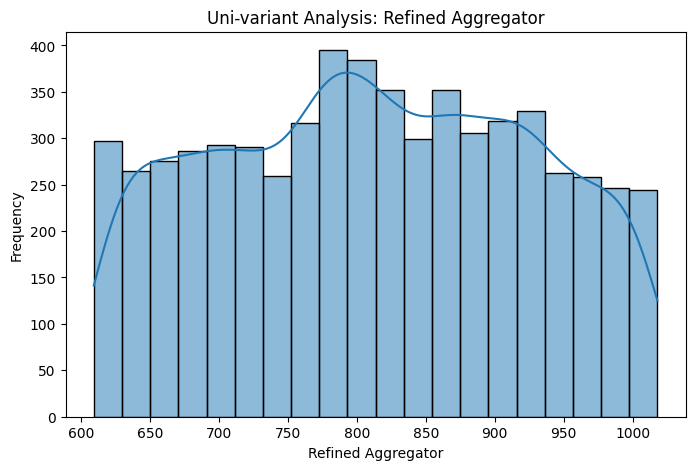

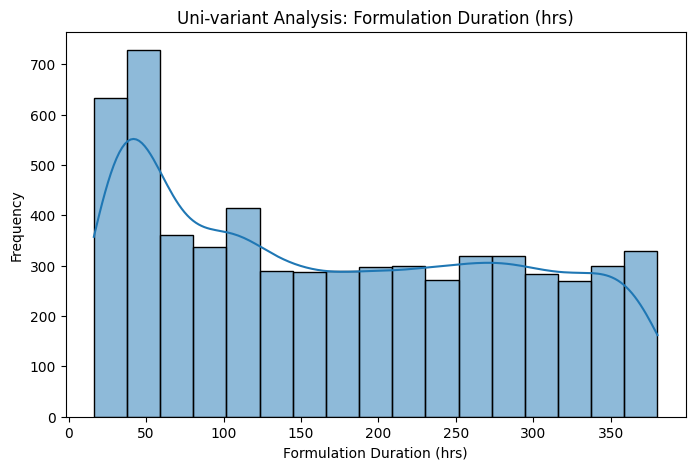

In [14]:
# List of independent variables
independent_variables = ['Material Quantity (gm)', 'Additive Catalyst (gm)', 'Ash Component (gm)', 
                          'Water Mix (ml)', 'Plasticizer (gm)', 'Moderate Aggregator', 
                          'Refined Aggregator', 'Formulation Duration (hrs)']

# Plot histograms for each feature
for variable in independent_variables:
    plt.figure(figsize=(8, 5))
    sns.histplot(df[variable], kde=True)
    plt.title(f'Uni-variant Analysis: {variable}')
    plt.xlabel(variable)
    plt.ylabel('Frequency')
    plt.show()

# Bi variant analysis

Using scatter plots

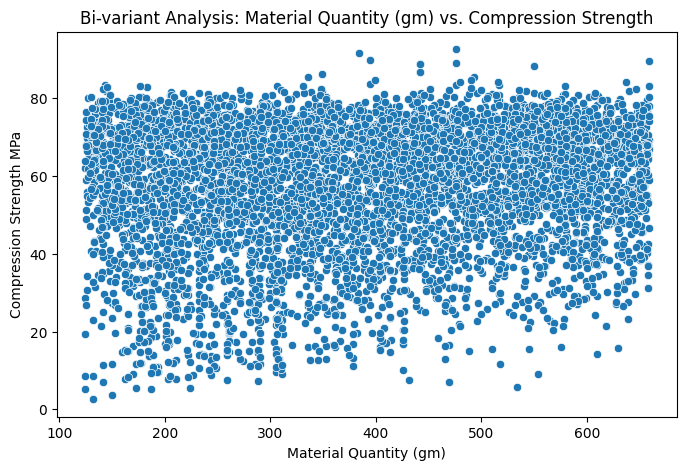

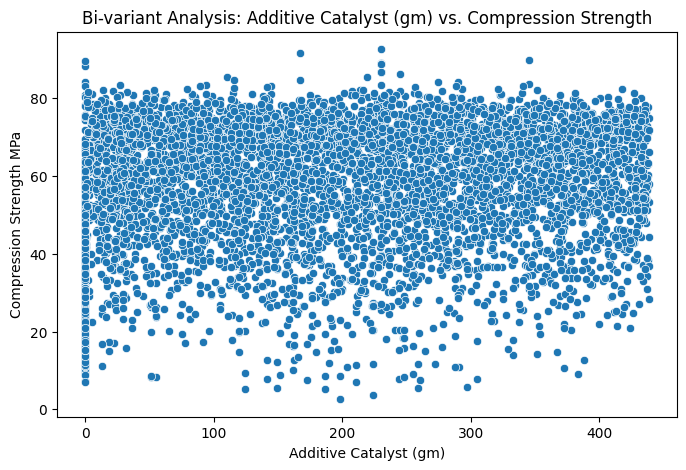

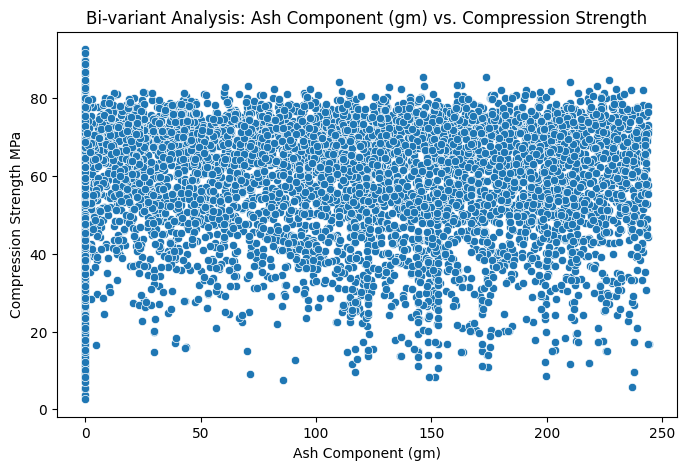

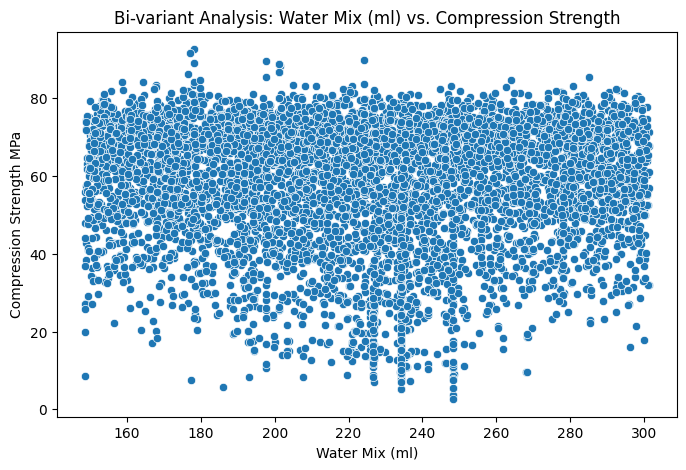

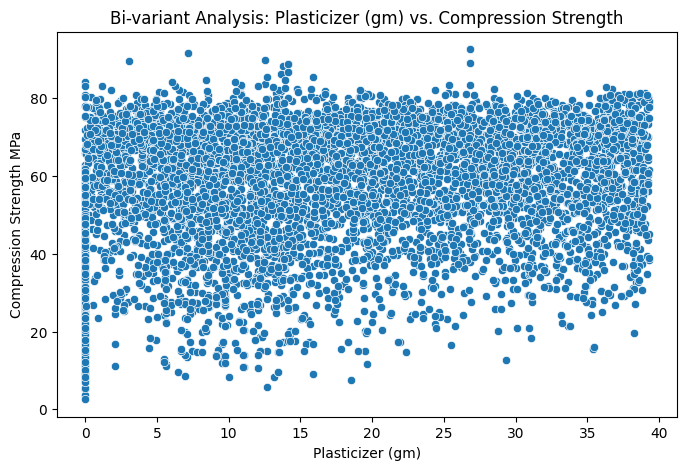

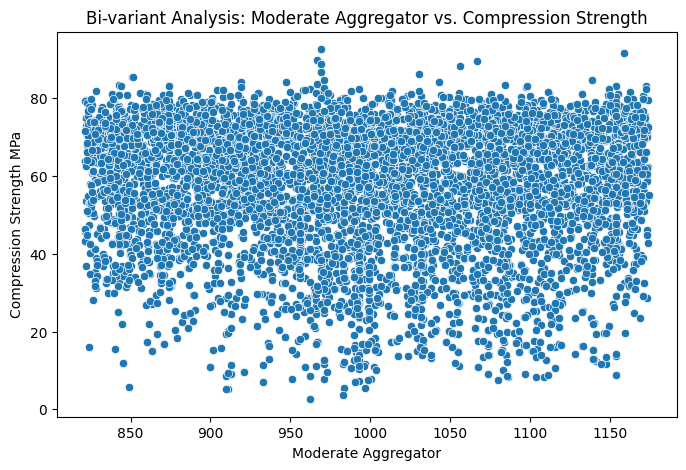

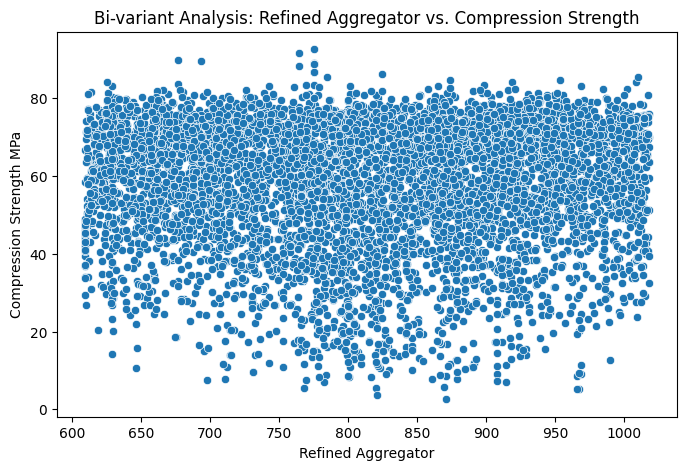

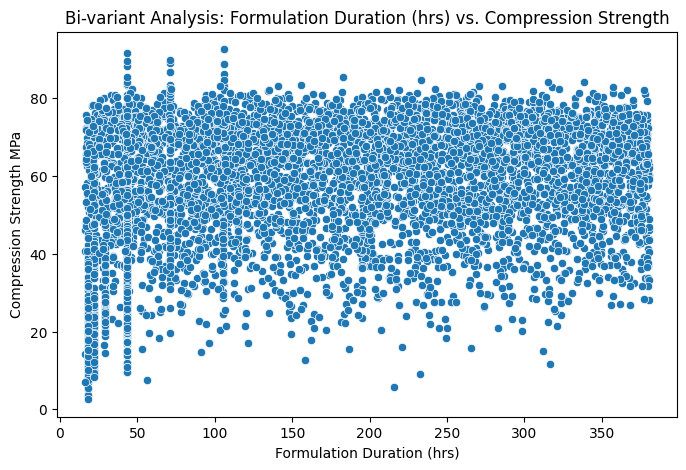

In [15]:
# Scatter plots for each feature against Compression Strength
for variable in independent_variables:
    plt.figure(figsize=(8, 5))
    sns.scatterplot(x=variable, y='Compression Strength MPa', data=df)
    plt.title(f'Bi-variant Analysis: {variable} vs. Compression Strength')
    plt.xlabel(variable)
    plt.ylabel('Compression Strength MPa')
    plt.show()

# Multi variant analysis

<Figure size 1200x800 with 0 Axes>

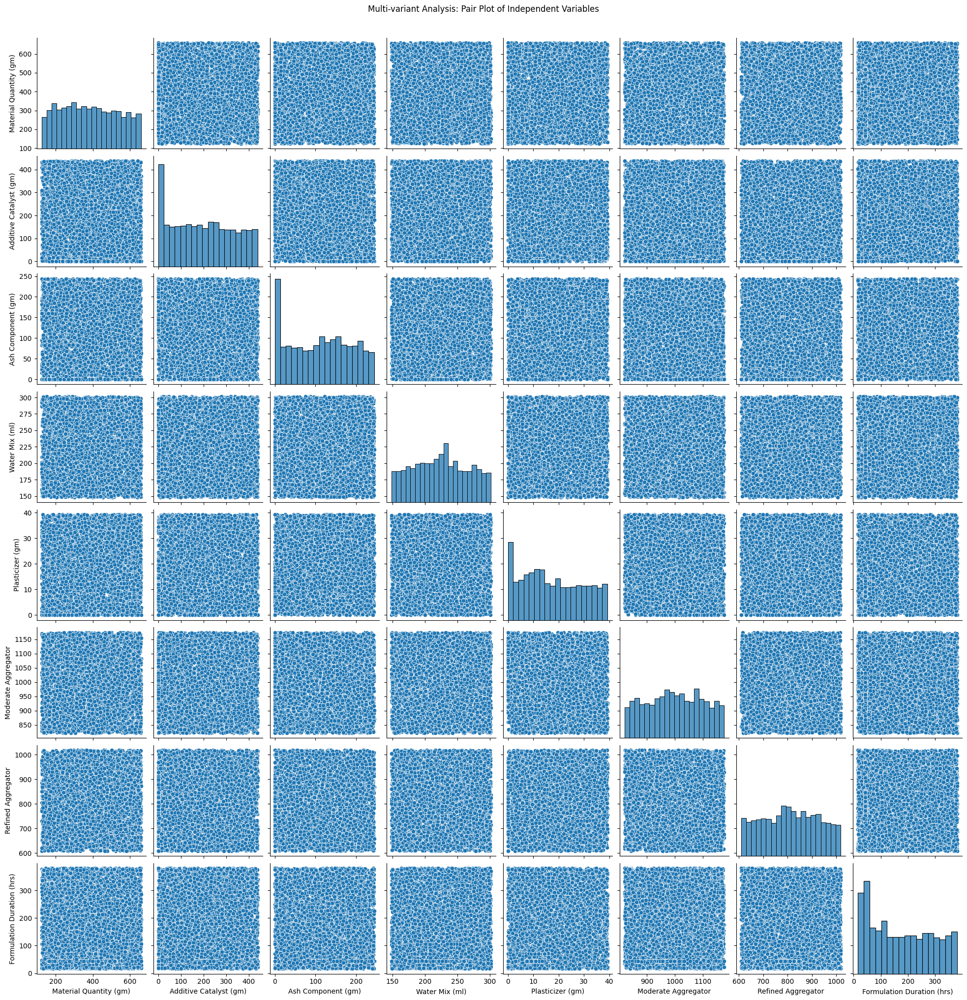

In [16]:
# Pair plot for all independent variables
plt.figure(figsize=(12, 8))
sns.pairplot(df[independent_variables])
plt.suptitle('Multi-variant Analysis: Pair Plot of Independent Variables', y=1.02)
plt.show()

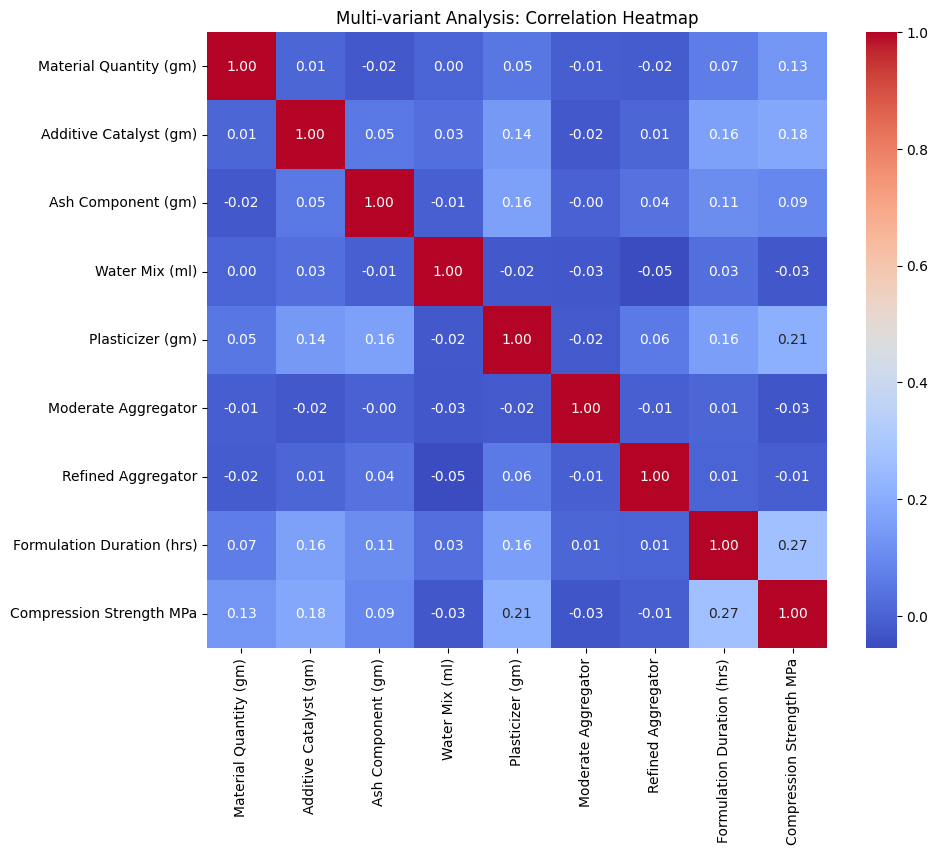

In [17]:
# Heatmap for correlation matrix
plt.figure(figsize=(10, 8))
correlation_matrix = df[independent_variables + ['Compression Strength MPa']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Multi-variant Analysis: Correlation Heatmap')
plt.show()

Detecting outliers

In [18]:
iqrValue = 1.5
outliersList = []

# Detecting outliers
for feature in df.columns:
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1

    lowerBound = Q1 - iqrValue * IQR
    upperBound = Q3 + iqrValue * IQR

    outliersValue = df[(df[feature] < lowerBound) | (df[feature] > upperBound)]
    outliersList.append(outliersValue)

# create Dataframe of outlier list
outliersDataFrame = pd.concat(outliersList, axis=0).drop_duplicates()
print(outliersDataFrame)


      Material Quantity (gm)  Additive Catalyst (gm)  Ash Component (gm)  \
34                    172.39                  258.64                0.00   
81                    193.74                  290.60                0.00   
106                   206.06                   51.48              151.65   
210                   211.06                  141.52                0.00   
214                   554.30                  383.29               71.58   
354                   191.54                  287.92                0.00   
396                   274.50                    0.00                0.00   
442                   177.39                    0.00              218.26   
880                   132.13                  198.13                0.00   
913                   534.29                  297.44              236.79   
1085                  290.48                    0.00                0.00   
1201                  232.17                    0.00              152.74   
1383        


# Using Histograms to check Skewness of each variable

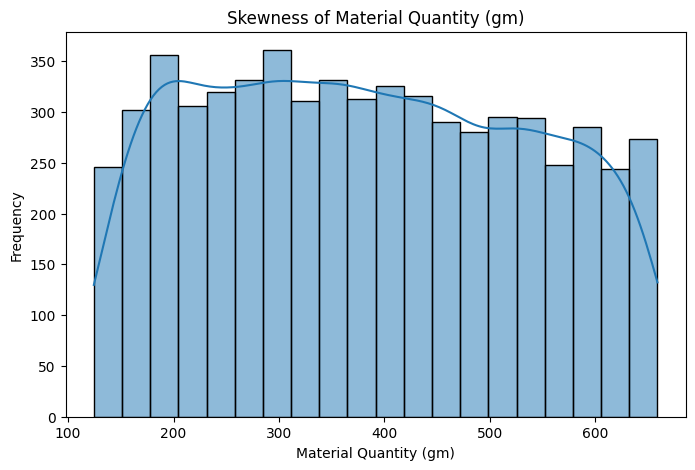

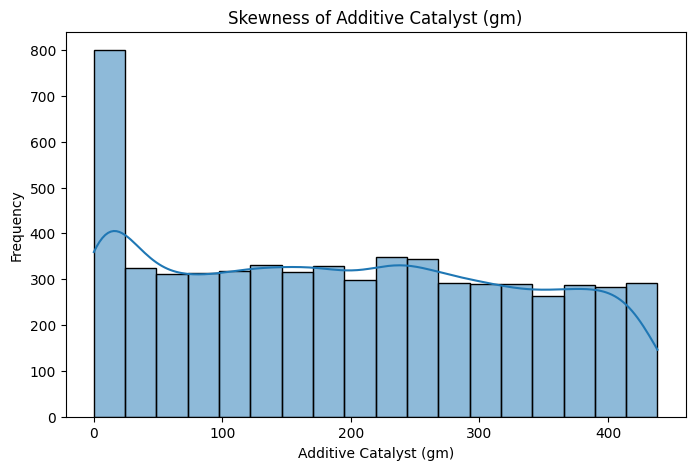

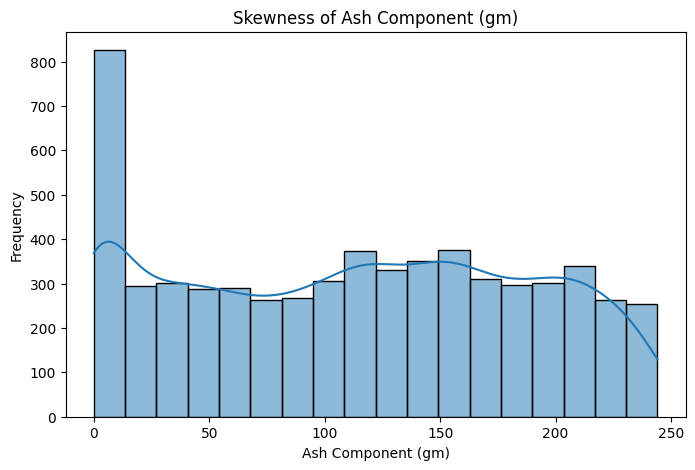

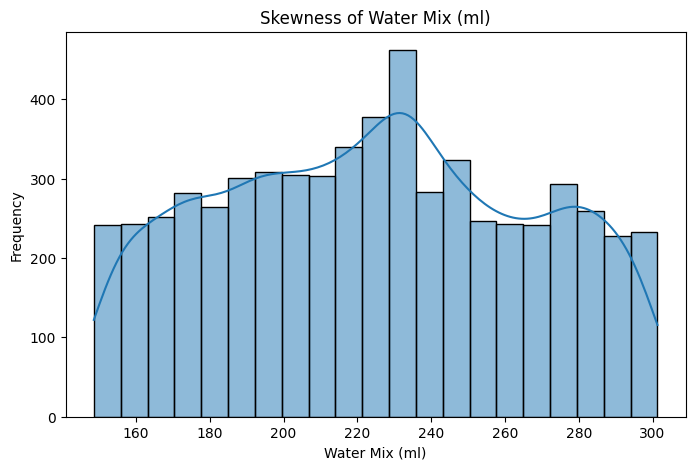

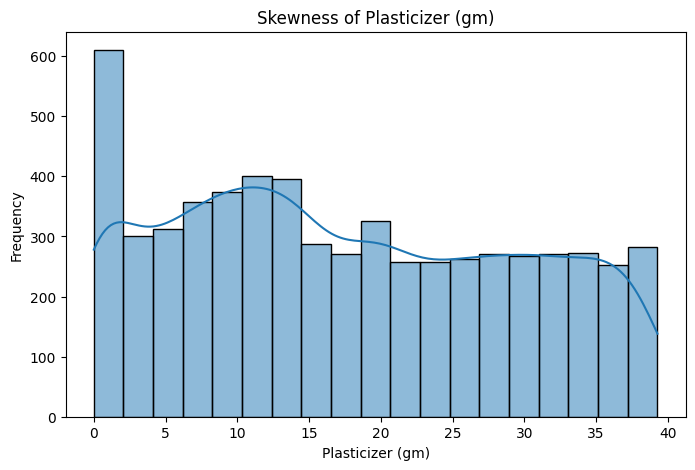

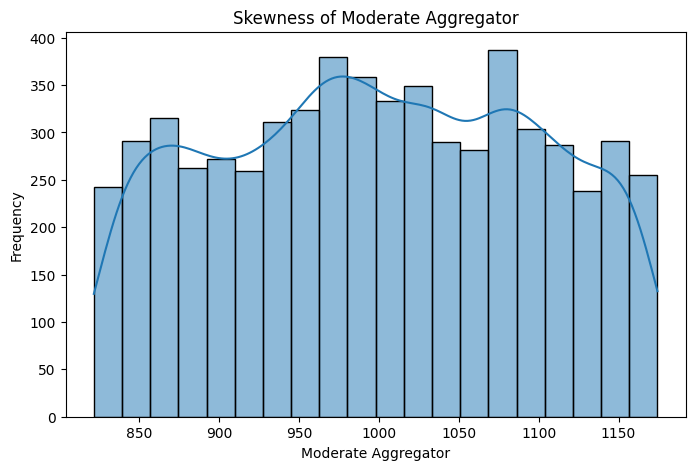

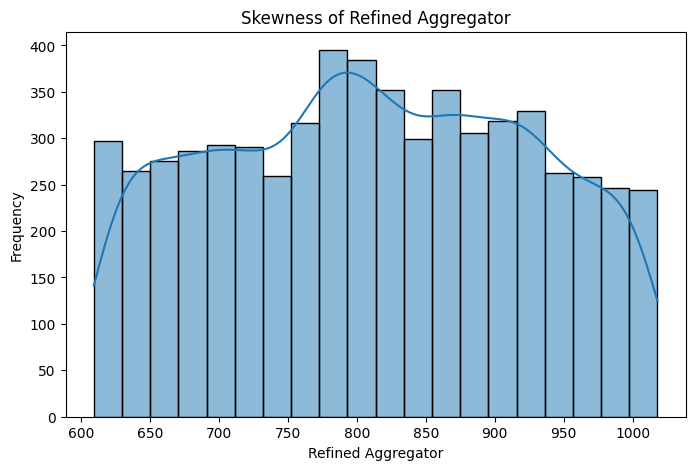

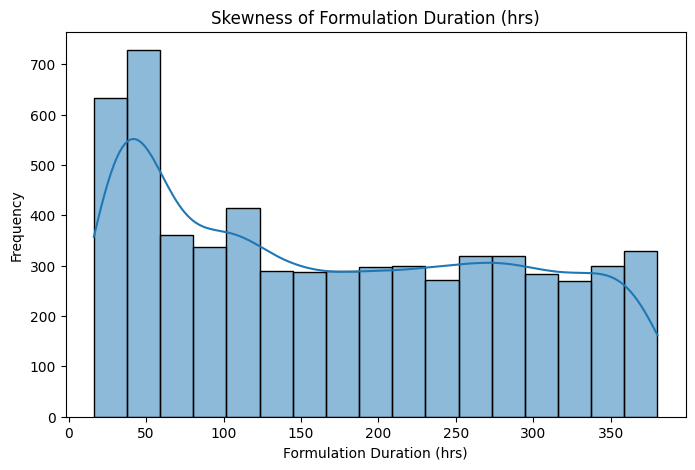

Skewness for each variable:
Material Quantity (gm)        0.095744
Additive Catalyst (gm)        0.106625
Ash Component (gm)           -0.001213
Water Mix (ml)                0.024731
Plasticizer (gm)              0.181212
Moderate Aggregator          -0.020399
Refined Aggregator           -0.006689
Formulation Duration (hrs)    0.231211
dtype: float64


In [19]:
# List of independent variables
independent_variables = ['Material Quantity (gm)', 'Additive Catalyst (gm)', 'Ash Component (gm)', 
                          'Water Mix (ml)', 'Plasticizer (gm)', 'Moderate Aggregator', 
                          'Refined Aggregator', 'Formulation Duration (hrs)']

# Plot histograms for each feature
for variable in independent_variables:
    plt.figure(figsize=(8, 5))
    sns.histplot(df[variable], kde=True)
    plt.title(f'Skewness of {variable}')
    plt.xlabel(variable)
    plt.ylabel('Frequency')
    plt.show()

# Check skewness numerically
skewness = df[independent_variables].skew()
print("Skewness for each variable:")
print(skewness)

# Checking distribution of each independent variables  using scatter plot and also using QQ plot to understand column distribution.

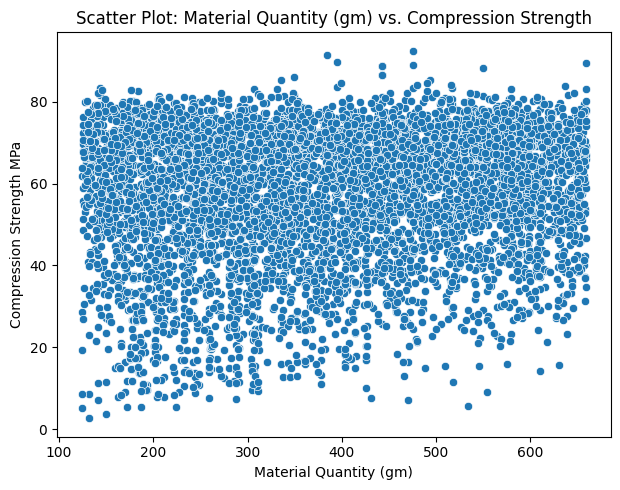

<Figure size 600x500 with 0 Axes>

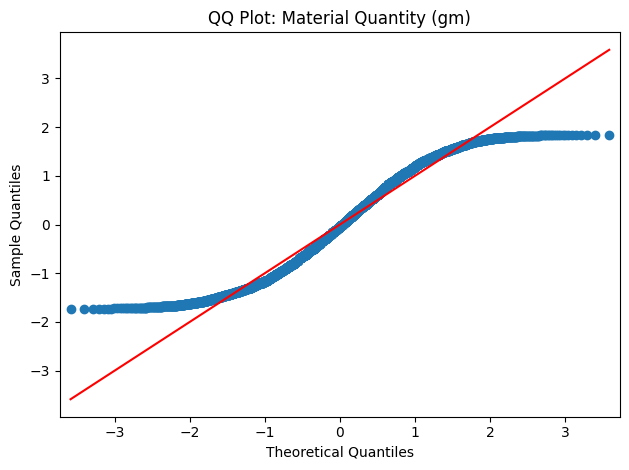

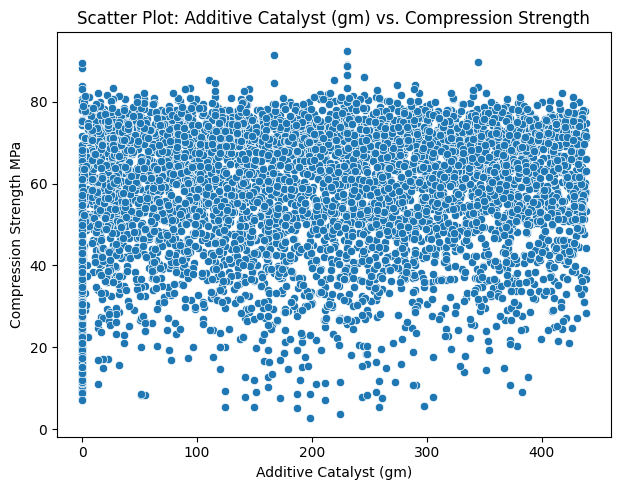

<Figure size 600x500 with 0 Axes>

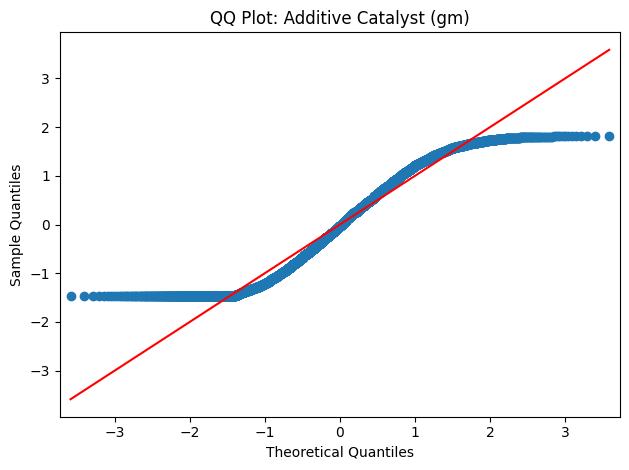

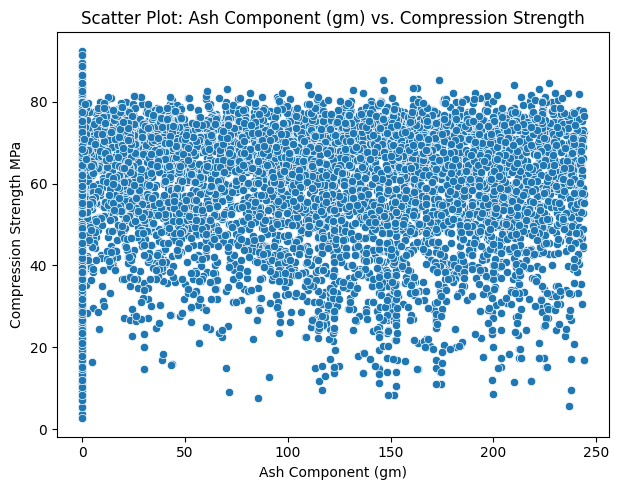

<Figure size 600x500 with 0 Axes>

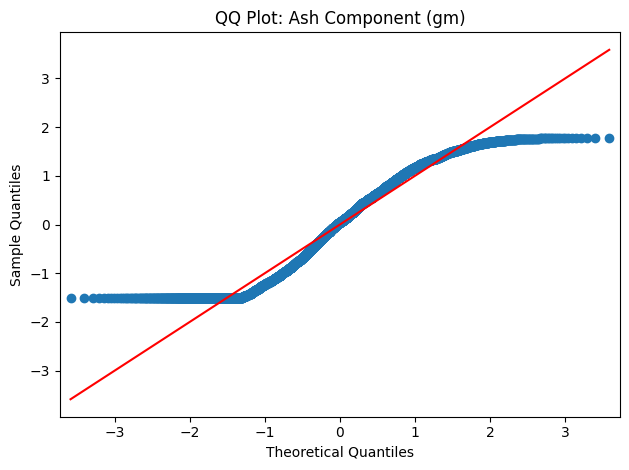

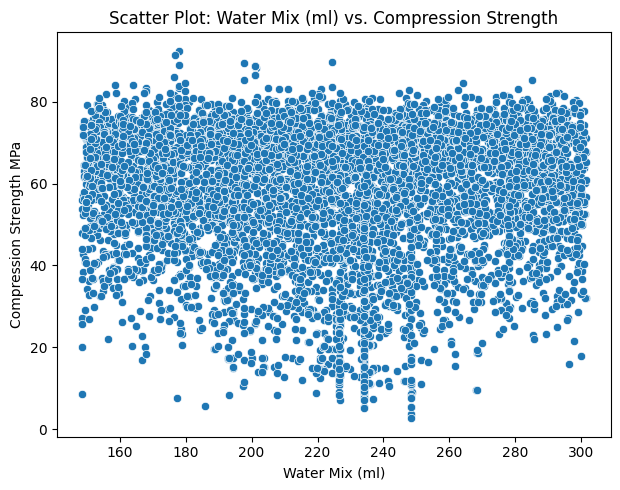

<Figure size 600x500 with 0 Axes>

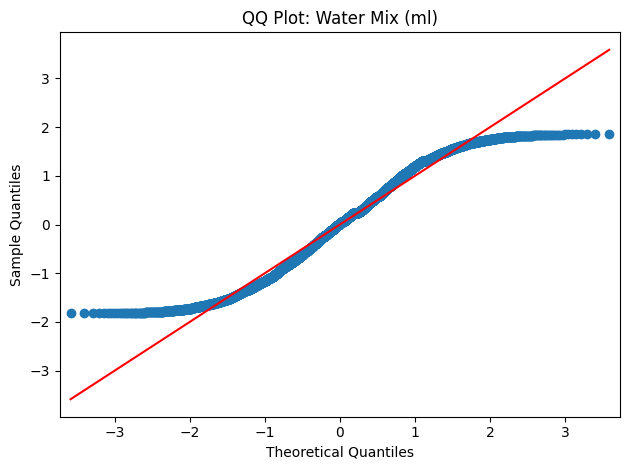

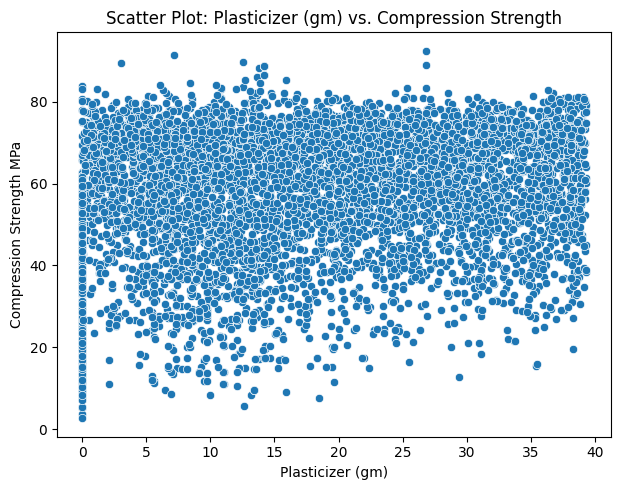

<Figure size 600x500 with 0 Axes>

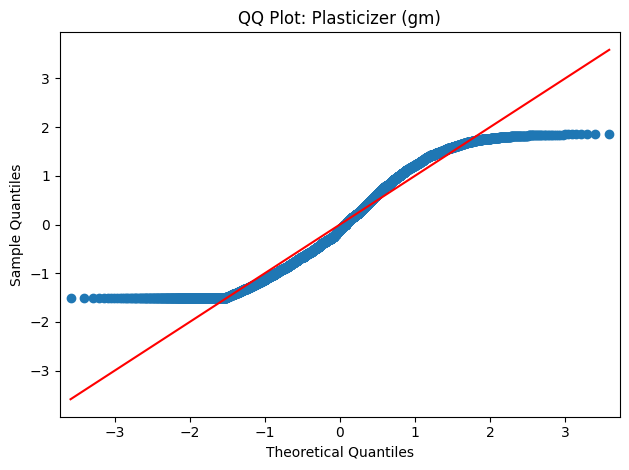

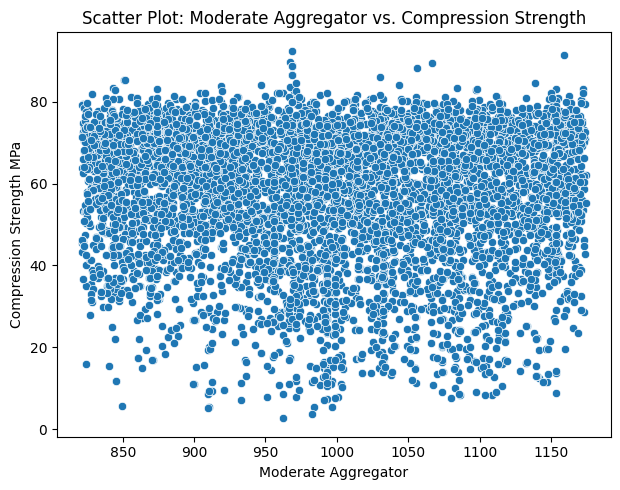

<Figure size 600x500 with 0 Axes>

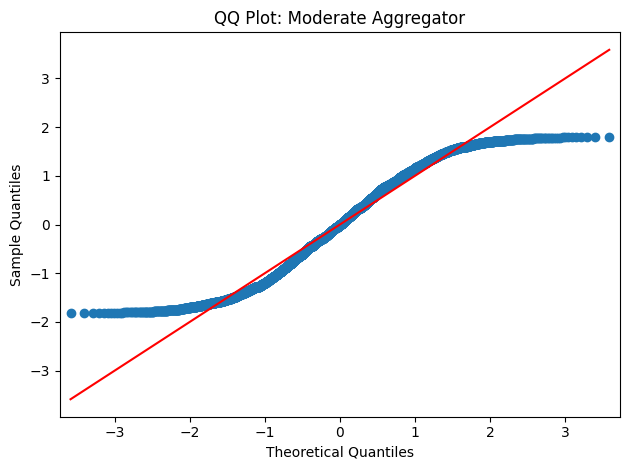

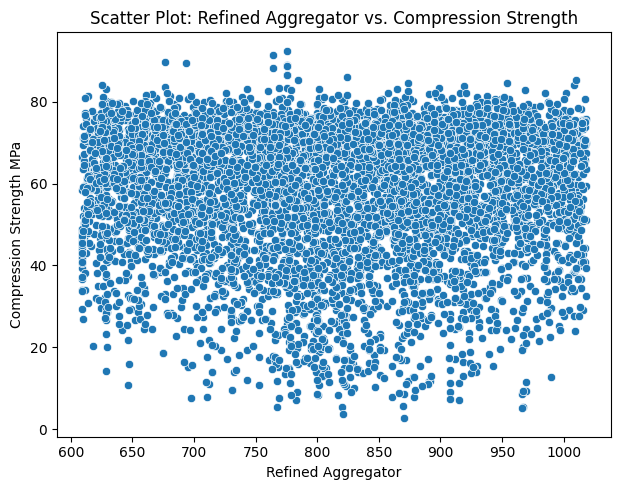

<Figure size 600x500 with 0 Axes>

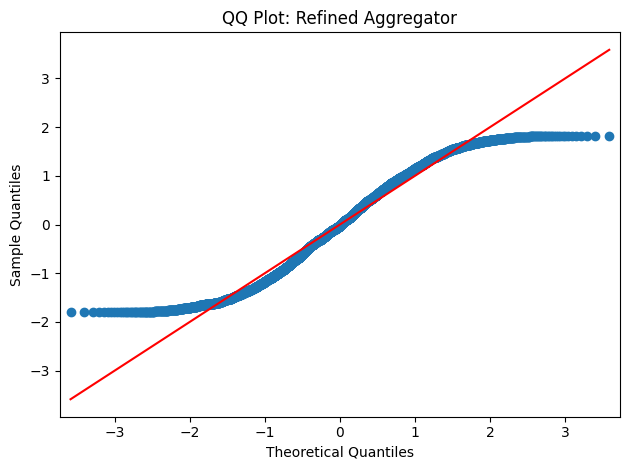

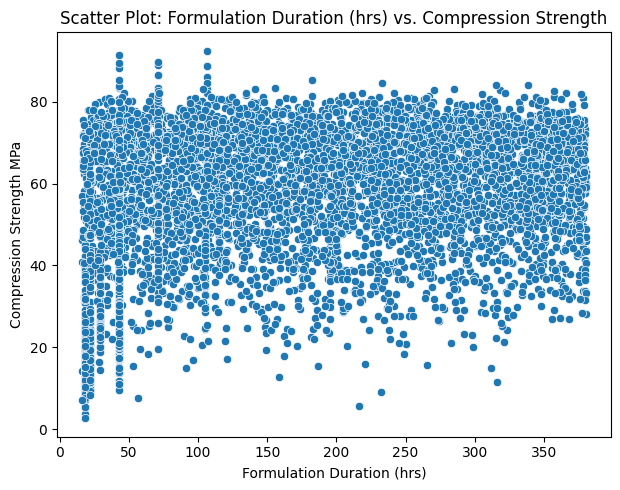

<Figure size 600x500 with 0 Axes>

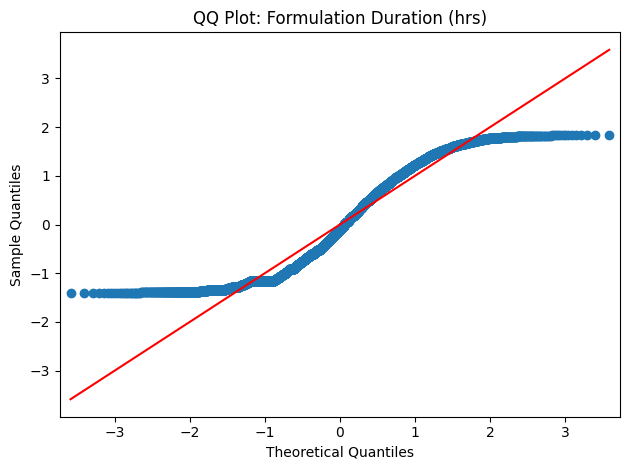

In [20]:
import statsmodels.api as sm
from scipy.stats import probplot

## Plot scatter plots and QQ plots
for variable in independent_variables:
    plt.figure(figsize=(12, 5))

    # Scatter plot
    plt.subplot(1, 2, 1)
    sns.scatterplot(x=variable, y='Compression Strength MPa', data=df)
    plt.title(f'Scatter Plot: {variable} vs. Compression Strength')
    plt.xlabel(variable)
    plt.ylabel('Compression Strength MPa')
    plt.tight_layout()

    # QQ plot
    plt.figure(figsize=(6, 5))
    sm.qqplot(df[variable], line='s', fit=True)
    plt.title(f'QQ Plot: {variable}')
    plt.tight_layout()
    
    plt.show()

# Distribution analysis

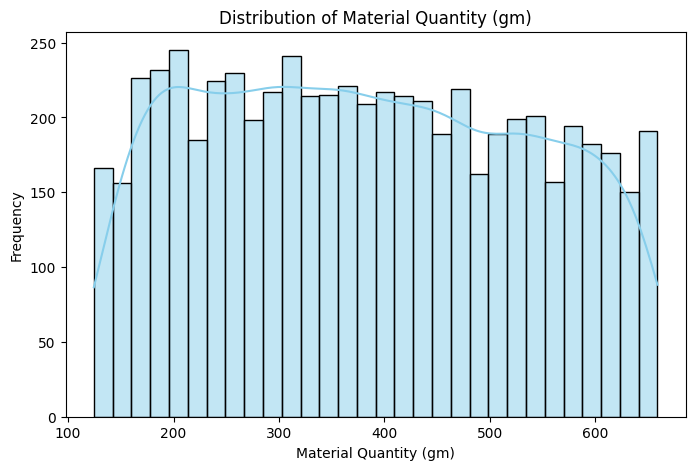

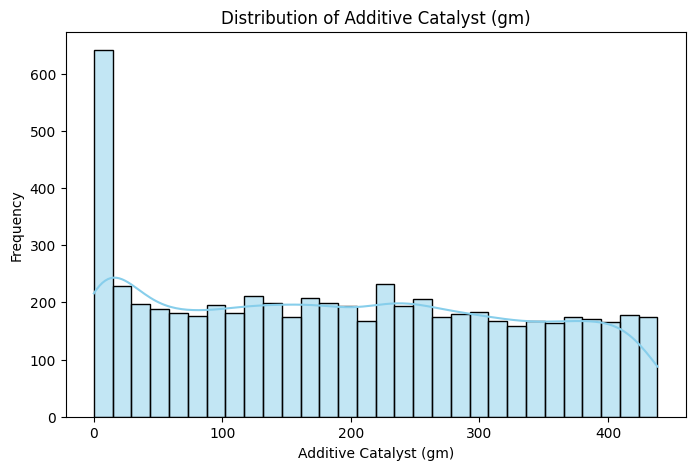

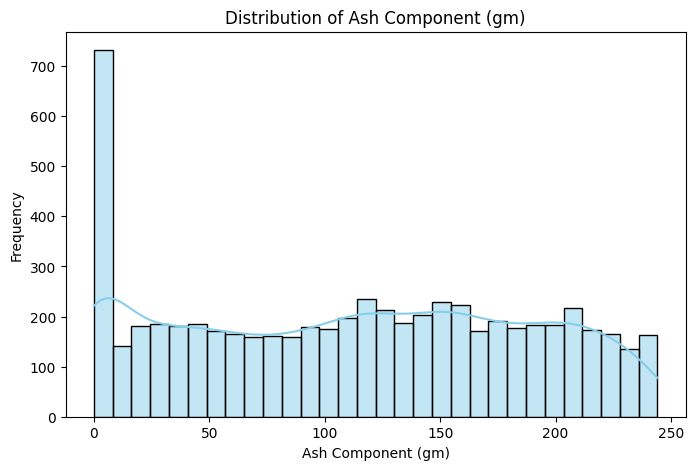

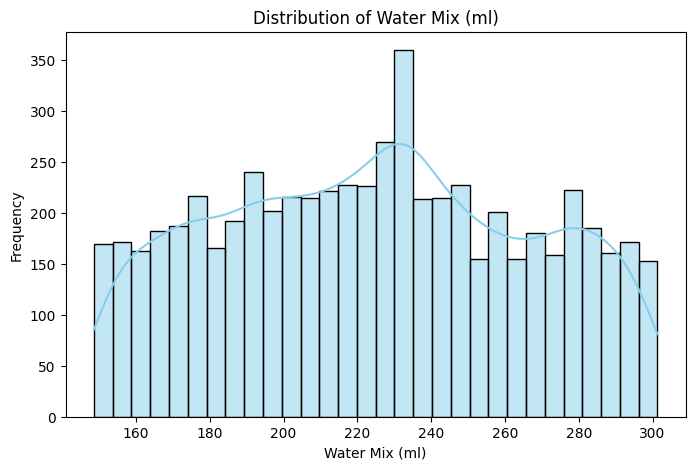

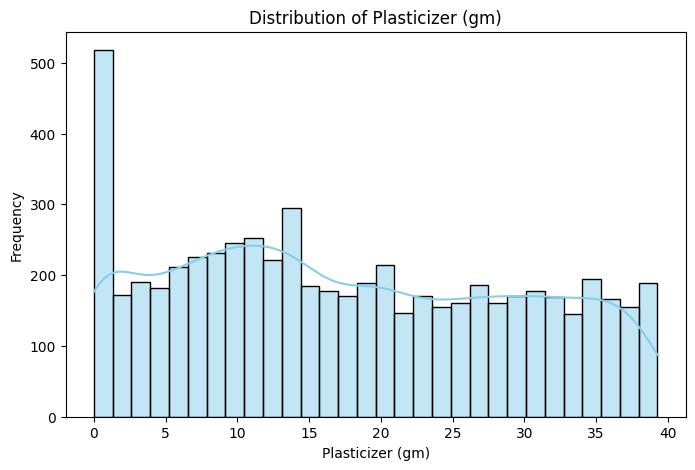

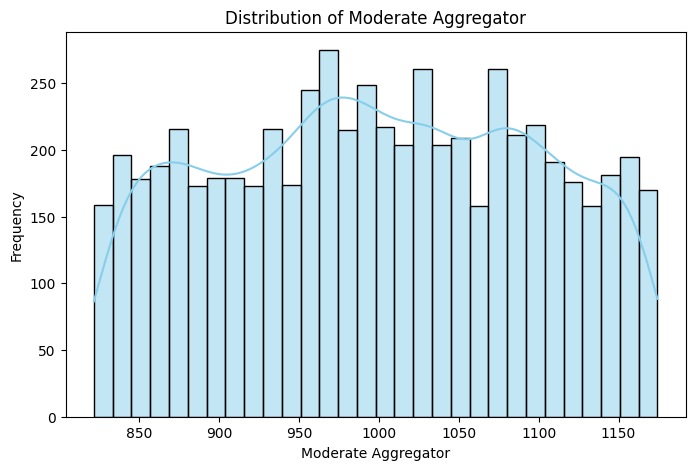

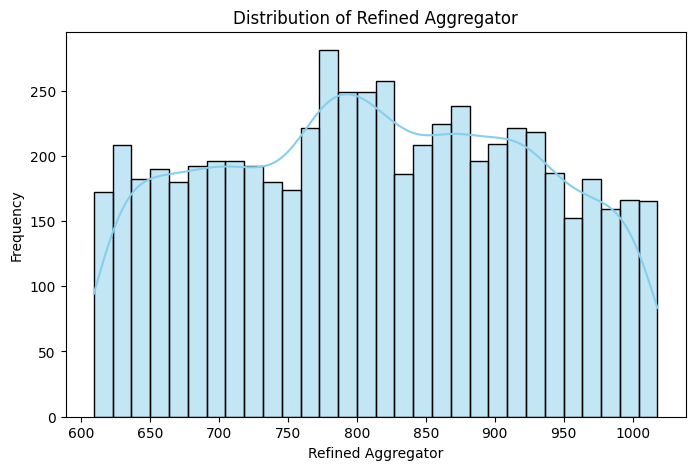

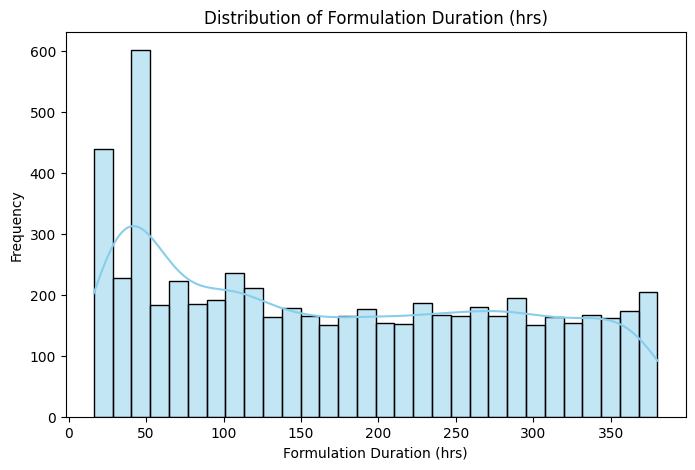

In [21]:
for variable in independent_variables:
    plt.figure(figsize=(8, 5))
    
    # Create a histogram using seaborn
    sns.histplot(df[variable], kde=True, bins=30, color='skyblue')
    
    # Set plot labels and title
    plt.title(f'Distribution of {variable}')
    plt.xlabel(variable)
    plt.ylabel('Frequency')
    
    plt.show()

In [22]:
df.isnull().sum()

Material Quantity (gm)        0
Additive Catalyst (gm)        0
Ash Component (gm)            0
Water Mix (ml)                0
Plasticizer (gm)              0
Moderate Aggregator           0
Refined Aggregator            0
Formulation Duration (hrs)    0
Compression Strength MPa      0
dtype: int64

Applying Min-max scalar to rescale the data b/w 0 to 1

In [23]:
from sklearn.preprocessing import MinMaxScaler
# Creating StandardScaler object
mmobj = MinMaxScaler()

# Scaling all features
#MCSEDataFrame[MCSEDataFrame.columns] = StdObject.fit_transform(MCSEDataFrame[MCSEDataFrame.columns])

features_to_scale = df.columns[:-1]
# Fit and transform the scaler on the selected features
df[features_to_scale] = mmobj.fit_transform(df[features_to_scale])



df.head()

,Material Quantity (gm),Additive Catalyst (gm),Ash Component (gm),Water Mix (ml),Plasticizer (gm),Moderate Aggregator,Refined Aggregator,Formulation Duration (hrs),Compression Strength MPa
0,0.677408,0.411887,0.087088,0.347388,0.410132,0.934272,0.242821,0.901593,79.89
1,0.016618,0.593290,0.760282,0.179324,0.159623,0.762513,0.980921,0.034643,59.80
2,0.815050,0.006477,0.457808,0.959997,0.304226,0.576470,0.492784,0.608324,77.86
3,0.499644,0.800625,0.312920,0.985596,0.483707,0.888102,0.665599,0.529011,71.74
4,0.505914,0.804183,0.796125,0.569203,0.433299,0.784253,0.420185,0.688434,76.07


# Feature selection

Using random forest to select feature of most importance

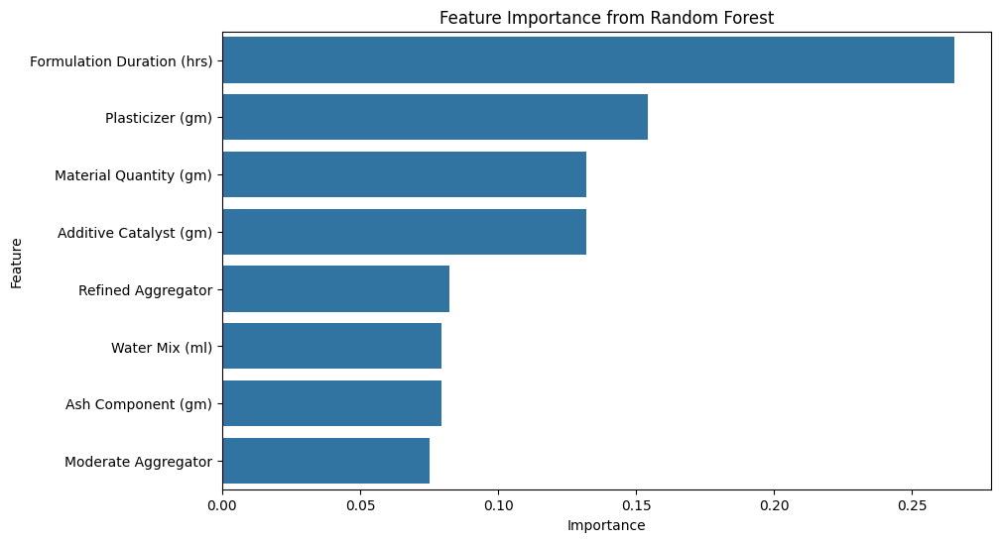

Top Features: ['Formulation Duration (hrs)', 'Plasticizer (gm)', 'Material Quantity (gm)', 'Additive Catalyst (gm)', 'Refined Aggregator']


In [24]:
from sklearn.ensemble import RandomForestRegressor
X = df.drop('Compression Strength MPa', axis=1)
y = df['Compression Strength MPa']

# Train a Random Forest Regressor
model = RandomForestRegressor()
model.fit(X, y)

# Get feature importances
feature_importances = model.feature_importances_

# Create a DataFrame with feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# Sort features by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot the top features
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance from Random Forest')
plt.show()

# Display the top features
top_features = feature_importance_df['Feature'].head(5).tolist()
print("Top Features:", top_features)

# Check the correlation matrix
correlation_matrix = df.corr()



From the above graphs it is clear that Formulation duration is the most important feature followed by  'Plasticizer (gm)', 'Additive Catalyst (gm)', 'Material Quantity (gm)'and 'Refined Aggregator'. As the Correlation difference between the independant features are  very less and as the Features are limited. Choosing all the features for modelling

# Phase5 : Feature Engineering &Predictive Modelling 

Checking the relationship of each independant variable with dependant varaible

In [25]:
from sklearn.linear_model import LinearRegression
import pandas as pd

# Assuming df is your DataFrame
X = df[['Material Quantity (gm)', 'Additive Catalyst (gm)', 'Ash Component (gm)', 
                          'Water Mix (ml)', 'Plasticizer (gm)', 'Moderate Aggregator', 
                          'Refined Aggregator', 'Formulation Duration (hrs)']]
y = df['Compression Strength MPa']

# Create and fit the model
model = LinearRegression()
model.fit(X, y)

# Print the coefficients
coefficients = pd.DataFrame({'Feature': X.columns, 'Coefficient': model.coef_})
print(coefficients)

# Make predictions
predictions = model.predict(X)

                      Feature  Coefficient
0      Material Quantity (gm)     6.275713
1      Additive Catalyst (gm)     6.547150
2          Ash Component (gm)     2.160753
3              Water Mix (ml)    -2.153733
4            Plasticizer (gm)     7.838578
5         Moderate Aggregator    -1.651204
6          Refined Aggregator    -1.379464
7  Formulation Duration (hrs)    11.271864


The top 4 features in order  are 
*Formulation Duration
*Plasticizer
*Additive Catalyst
*Material Quantity. 

Hence applying regression models on all  the  features for better results


In [26]:
from sklearn.model_selection import train_test_split

# X and y are the features and target variable
X = df.drop('Compression Strength MPa', axis=1)
y = df['Compression Strength MPa']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


***Decesion tree

In [27]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error


# Set the hyperparameters for Decision Tree
max_depth_value = 8  # Set the desired maximum depth
min_samples_split_value = 10  # Set the minimum samples required to split an internal node
min_samples_leaf_value = 1   # Set the minimum samples required to form a leaf node

# Create Decision Tree model with specified hyperparameters
model = DecisionTreeRegressor(
    max_depth=max_depth_value,
    min_samples_split=min_samples_split_value,
    min_samples_leaf=min_samples_leaf_value,
    random_state=42
)

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)  # Calculate RMSE
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)  # Calculate MAE

# Display the results
decision_tree_results = pd.DataFrame({
    'Metric': ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'R-squared (R2)', 'Mean Absolute Error (MAE)'],
    'Value': [mse, rmse, r2, mae]
})
print(decision_tree_results)


                           Metric       Value
0        Mean Squared Error (MSE)  162.685781
1  Root Mean Squared Error (RMSE)   12.754834
2                  R-squared (R2)    0.344717
3       Mean Absolute Error (MAE)   10.020772


***Random forrest

In [28]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV




param_grid_grid_search = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}


# Create a Random Forest model
rf_model = RandomForestRegressor(random_state=42)

# Create GridSearchCV object
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid_grid_search,
                           cv=3, verbose=2, n_jobs=-1)

# Fit the GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters from the grid search
best_params_grid_search = grid_search.best_params_

# Use the best parameters from Grid Search to create the final model
final_model_grid_search = RandomForestRegressor(**best_params_grid_search, random_state=42)

# Train the model on the full training set
final_model_grid_search.fit(X_train, y_train)

# Make predictions on the test set
y_pred_grid_search = final_model_grid_search.predict(X_test)

# Evaluate the model
mse_grid_search = mean_squared_error(y_test, y_pred_grid_search)
r2_grid_search = r2_score(y_test, y_pred_grid_search)
rmse_grid_search = mean_squared_error(y_test, y_pred_grid_search, squared=False)
mae_grid_search = mean_absolute_error(y_test, y_pred_grid_search)

# Display the results for Grid Search on the test set
random_forest_results_grid_search = pd.DataFrame({'Metric': ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)',
                                                              'R-squared (R2)', 'Mean Absolute Error (MAE)'],
                                                  'Value': [mse_grid_search, rmse_grid_search, r2_grid_search, mae_grid_search]})
print("Random Forest Model with Grid Search Results on Test Set:")
print(random_forest_results_grid_search)

Fitting 3 folds for each of 144 candidates, totalling 432 fits


Random Forest Model with Grid Search Results on Test Set:
                           Metric       Value
0        Mean Squared Error (MSE)  149.930108
1  Root Mean Squared Error (RMSE)   12.244595
2                  R-squared (R2)    0.396096
3       Mean Absolute Error (MAE)    9.581446


***XG Boost

In [29]:
from xgboost import XGBRegressor



param_grid_grid_search = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'min_child_weight': [1, 3],
    'gamma': [0, 0.2],
    'colsample_bytree': [0.8, 1.0],
}

# Create an XGBoost model
xgb_model = XGBRegressor(random_state=42)

# Create GridSearchCV object for XGBoost
xgb_grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid_grid_search,
                                cv=3, verbose=2, n_jobs=-1)

# Fit the GridSearchCV to the data
xgb_grid_search.fit(X_train, y_train)

# Get the best parameters from the grid search
best_params_xgb_grid_search = xgb_grid_search.best_params_

# Print the best parameters from Grid Search
print("Best Hyperparameters (XGBoost - Grid Search):", best_params_xgb_grid_search)

# Use the best parameters from Grid Search to create the final XGBoost model
final_xgb_model_grid_search = XGBRegressor(**best_params_xgb_grid_search, random_state=42)

# Train the model
final_xgb_model_grid_search.fit(X_train, y_train)

# Make predictions on the test set
y_pred_xgb_grid_search = final_xgb_model_grid_search.predict(X_test)

# Evaluate the XGBoost model with Grid Search
mse_xgb_grid_search = mean_squared_error(y_test, y_pred_xgb_grid_search)
r2_xgb_grid_search = r2_score(y_test, y_pred_xgb_grid_search)
rmse_xgb_grid_search = mean_squared_error(y_test, y_pred_xgb_grid_search, squared=False)
mae_xgb_grid_search = mean_absolute_error(y_test, y_pred_xgb_grid_search)

# Display the results for Grid Search
xgboost_results_grid_search = pd.DataFrame({'Metric': ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)',
                                                        'R-squared (R2)', 'Mean Absolute Error (MAE)'],
                                             'Value': [mse_xgb_grid_search, rmse_xgb_grid_search, r2_xgb_grid_search,
                                                       mae_xgb_grid_search]})
print("Results for XGBoost with Grid Search:")
print(xgboost_results_grid_search)

Fitting 3 folds for each of 432 candidates, totalling 1296 fits
Best Hyperparameters (XGBoost - Grid Search): {'colsample_bytree': 0.8, 'gamma': 0.2, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 50, 'subsample': 1.0}
Results for XGBoost with Grid Search:
                           Metric       Value
0        Mean Squared Error (MSE)  157.653386
1  Root Mean Squared Error (RMSE)   12.556010
2                  R-squared (R2)    0.364987
3       Mean Absolute Error (MAE)    9.935610


In [30]:
input_features = [0.016618,0.593290,0.760282,0.179324,0.159623,0.762513,0.980921,0.034643]
prediction = final_model_grid_search.predict([input_features])

c:\Users\DUSHY\OneDrive\Desktop\ask\code\model\venv\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [31]:
prediction

array([56.57660143])

In [32]:
from sklearn.svm import SVR


# Define the hyperparameter grid for Grid Search
param_grid_svm_grid_search = {
    'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'poly'],
    'degree': [2, 3, 4],
    'gamma': ['scale', 'auto']
}

# Create an SVR model
svm_model = SVR()

# Create GridSearchCV object for SVM
svm_grid_search = GridSearchCV(estimator=svm_model, param_grid=param_grid_svm_grid_search,
                                cv=3, verbose=2, n_jobs=-1)

# Fit the GridSearchCV to the data
svm_grid_search.fit(X_train, y_train)

# Get the best parameters from the grid search
best_params_svm_grid_search = svm_grid_search.best_params_

# Print the best parameters from Grid Search
print("Best Hyperparameters (Grid Search - SVM):", best_params_svm_grid_search)

# Use the best parameters from Grid Search to create the final SVM model
final_svm_model_grid_search = SVR(**best_params_svm_grid_search)

# Train the model
final_svm_model_grid_search.fit(X_train, y_train)

# Make predictions on the test set
y_pred_svm_grid_search = final_svm_model_grid_search.predict(X_test)

# Evaluate the SVM model with Grid Search
mse_svm_grid_search = mean_squared_error(y_test, y_pred_svm_grid_search)
r2_svm_grid_search = r2_score(y_test, y_pred_svm_grid_search)
rmse_svm_grid_search = mean_squared_error(y_test, y_pred_svm_grid_search, squared=False)
mad_svm_grid_search = mean_absolute_error(y_test, y_pred_svm_grid_search)

# Display the results for SVM with Grid Search
svm_results_grid_search = pd.DataFrame({'Metric': ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)',
                                                   'R-squared (R2)', 'Mean Absolute Error (MAE)'],
                                        'Value': [mse_svm_grid_search, rmse_svm_grid_search, r2_svm_grid_search,
                                                  mad_svm_grid_search]})
print("\nResults for SVM with Grid Search:")
print(svm_results_grid_search)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


Best Hyperparameters (Grid Search - SVM): {'C': 10, 'degree': 2, 'gamma': 'scale', 'kernel': 'rbf'}

Results for SVM with Grid Search:
                           Metric       Value
0        Mean Squared Error (MSE)  184.622219
1  Root Mean Squared Error (RMSE)   13.587576
2                  R-squared (R2)    0.256360
3       Mean Absolute Error (MAE)   10.517308


***Linear regressor

In [33]:
from sklearn.linear_model import LinearRegression


## Define the hyperparameter grid for Grid Search
param_grid_lr_grid_search = {
    'fit_intercept': [True, False],
    'positive': [False, True],
    'copy_X': [True, False],
    'n_jobs': [None, 1, 5, 10]
}

# Create a Linear Regression model
lr_model = LinearRegression()

# Create GridSearchCV object for Linear Regression
lr_grid_search = GridSearchCV(estimator=lr_model, param_grid=param_grid_lr_grid_search,
                              cv=3, verbose=2, n_jobs=-1)

# Fit the GridSearchCV to the data
lr_grid_search.fit(X_train, y_train)

# Get the best parameters from the grid search
best_params_lr_grid_search = lr_grid_search.best_params_

# Print the best parameters from Grid Search
print("\nBest Hyperparameters (Grid Search - Linear Regression):", best_params_lr_grid_search)

# Use the best parameters from Grid Search to create the final Linear Regression model
final_lr_model_grid_search = LinearRegression(**best_params_lr_grid_search)

# Train the model
final_lr_model_grid_search.fit(X_train, y_train)

# Make predictions on the test set
y_pred_lr_grid_search = final_lr_model_grid_search.predict(X_test)

# Evaluate the Linear Regression model with Grid Search
mse_lr_grid_search = mean_squared_error(y_test, y_pred_lr_grid_search)
r2_lr_grid_search = r2_score(y_test, y_pred_lr_grid_search)
rmse_lr_grid_search = mean_squared_error(y_test, y_pred_lr_grid_search, squared=False)
mad_lr_grid_search = mean_absolute_error(y_test, y_pred_lr_grid_search)

# Display the results for Linear Regression with Grid Search
lr_results_grid_search = pd.DataFrame({'Metric': ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)',
                                                   'R-squared (R2)', 'Mean Absolute Error (MAE)'],
                                        'Value': [mse_lr_grid_search, rmse_lr_grid_search, r2_lr_grid_search,
                                                  mad_lr_grid_search]})
print("\nResults for Linear Regression with Grid Search:")
print(lr_results_grid_search)

Fitting 3 folds for each of 32 candidates, totalling 96 fits

Best Hyperparameters (Grid Search - Linear Regression): {'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}

Results for Linear Regression with Grid Search:
                           Metric       Value
0        Mean Squared Error (MSE)  220.519095
1  Root Mean Squared Error (RMSE)   14.849885
2                  R-squared (R2)    0.111770
3       Mean Absolute Error (MAE)   12.094149


***Polynomial Regression

In [34]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline


# Define the hyperparameter grid for Grid Search
param_grid_poly_grid_search = {
    'polynomialfeatures__degree': [2, 3, 4],
    'linearregression__fit_intercept': [True, False],
    'linearregression__positive': [False, True],
    'linearregression__copy_X': [True, False],
    'linearregression__n_jobs': [None, 1, 5, 10]
}

# Create a Polynomial Regression model
poly_model = make_pipeline(PolynomialFeatures(), LinearRegression())

# Create GridSearchCV object for Polynomial Regression
poly_grid_search = GridSearchCV(estimator=poly_model, param_grid=param_grid_poly_grid_search,
                                cv=3, verbose=2, n_jobs=-1)

# Fit the GridSearchCV to the data
poly_grid_search.fit(X_train, y_train)

# Get the best parameters from the grid search
best_params_poly_grid_search = poly_grid_search.best_params_

# Print the best parameters from Grid Search
print("Best Hyperparameters (Grid Search - Polynomial Regression):", best_params_poly_grid_search)

# Use the best parameters from Grid Search to create the final Polynomial Regression model
final_poly_model_grid_search = make_pipeline(
    PolynomialFeatures(degree=best_params_poly_grid_search['polynomialfeatures__degree']),
    LinearRegression(
        fit_intercept=best_params_poly_grid_search['linearregression__fit_intercept'],
        positive=best_params_poly_grid_search['linearregression__positive'],
        copy_X=best_params_poly_grid_search['linearregression__copy_X'],
        n_jobs=best_params_poly_grid_search['linearregression__n_jobs']
    )
)

# Train the model
final_poly_model_grid_search.fit(X_train, y_train)

# Make predictions on the test set
y_pred_poly_grid_search = final_poly_model_grid_search.predict(X_test)

# Evaluate the Polynomial Regression model with Grid Search
mse_poly_grid_search = mean_squared_error(y_test, y_pred_poly_grid_search)
r2_poly_grid_search = r2_score(y_test, y_pred_poly_grid_search)
rmse_poly_grid_search = mean_squared_error(y_test, y_pred_poly_grid_search, squared=False)
mad_poly_grid_search = mean_absolute_error(y_test, y_pred_poly_grid_search)

# Display the results for Polynomial Regression with Grid Search
poly_results_grid_search = pd.DataFrame({'Metric': ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)',
                                                     'R-squared (R2)', 'Mean Absolute Error (MAE)'],
                                          'Value': [mse_poly_grid_search, rmse_poly_grid_search, r2_poly_grid_search,
                                                    mad_poly_grid_search]})
print("\nResults for Polynomial Regression with Grid Search:")
print(poly_results_grid_search)

Fitting 3 folds for each of 96 candidates, totalling 288 fits


Best Hyperparameters (Grid Search - Polynomial Regression): {'linearregression__copy_X': True, 'linearregression__fit_intercept': False, 'linearregression__n_jobs': None, 'linearregression__positive': False, 'polynomialfeatures__degree': 3}

Results for Polynomial Regression with Grid Search:
                           Metric       Value
0        Mean Squared Error (MSE)  181.899039
1  Root Mean Squared Error (RMSE)   13.486995
2                  R-squared (R2)    0.267328
3       Mean Absolute Error (MAE)   10.698976


Creating a dataframe for all resuls to compare 

In [35]:
# Adding a 'Model' column to each DataFrame
poly_results_grid_search['Model'] = 'Polynomial Regression '
lr_results_grid_search['Model'] = 'Linear Regression '
svm_results_grid_search['Model'] = 'SVM '
xgboost_results_grid_search['Model'] = 'XGBoost'
random_forest_results_grid_search['Model'] = 'Random Forest'
decision_tree_results['Model'] = 'Decision Tree'

# Concatenate the DataFrames
all_results = pd.concat([poly_results_grid_search, 
                         lr_results_grid_search, 
                         svm_results_grid_search, 
                          xgboost_results_grid_search,
                         random_forest_results_grid_search,
                         decision_tree_results],
                        ignore_index=True)

# Create a pivot table
all_results = all_results.pivot(index='Model', columns='Metric', values='Value')

# Display the pivot table
all_results

Metric,Mean Absolute Error (MAE),Mean Squared Error (MSE),R-squared (R2),Root Mean Squared Error (RMSE)
Model,,,,
Decision Tree,10.020772,162.685781,0.344717,12.754834
Linear Regression,12.094149,220.519095,0.111770,14.849885
Polynomial Regression,10.698976,181.899039,0.267328,13.486995
Random Forest,9.581446,149.930108,0.396096,12.244595
SVM,10.517308,184.622219,0.256360,13.587576
XGBoost,9.935610,157.653386,0.364987,12.556010


Visualizing the results

C:\Users\DUSHY\AppData\Local\Temp\ipykernel_19688\443430490.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=all_results[metric], y=all_results.index, ax=axes[i], label=metric, palette='viridis')
C:\Users\DUSHY\AppData\Local\Temp\ipykernel_19688\443430490.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=all_results[metric], y=all_results.index, ax=axes[i], label=metric, palette='viridis')
C:\Users\DUSHY\AppData\Local\Temp\ipykernel_19688\443430490.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=all_results[metric], y=all_r

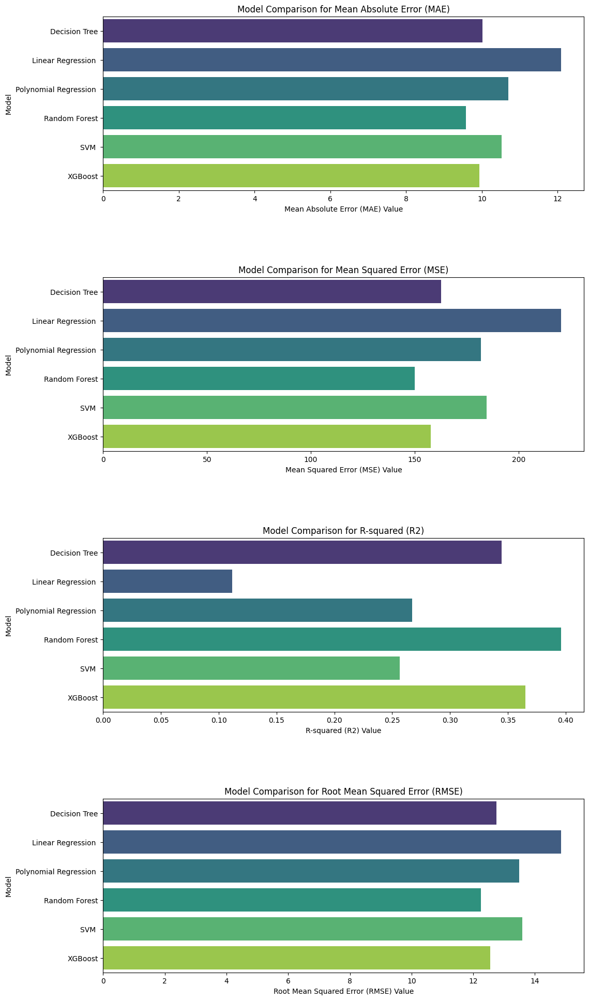

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up subplots for each metric
fig, axes = plt.subplots(nrows=len(all_results.columns), figsize=(12, 6 * len(all_results.columns)))
fig.subplots_adjust(hspace=0.5)  # Adjust vertical space between subplots

# Loop through each metric
for i, metric in enumerate(all_results.columns):
    # Plot a horizontal bar plot for the current metric
    sns.barplot(x=all_results[metric], y=all_results.index, ax=axes[i], label=metric, palette='viridis')
    
    axes[i].set_title(f'Model Comparison for {metric}')
    axes[i].set_xlabel(f'{metric} Value')
    axes[i].set_ylabel('Model')
    

# Show the plots
plt.show()

Conclusion

Looking at the performance metrics of these machine learning models, each approach offers a unique perspective on handling the data. The Decision Tree model showcases moderate performance with a Mean Squared Error (MSE) of 10.02 and an R-squared value of 0.34, indicating some predictive capability based on the dataset.

Moving on to Linear Regression, it reveals a higher MSE of 12.09 and a lower R-squared value of 0.11, suggesting weaker predictive ability compared to other models. In contrast, Polynomial Regression shows an improvement over Linear Regression, with a lower MSE of 10.70 and a slightly higher R-squared value of 0.27.

Among the models, Random Forest emerges as a standout performer, exhibiting a lower MSE of 9.58 and a relatively higher R-squared value of 0.40, signifying robust predictive power. Meanwhile, Support Vector Machine (SVM) and XGBoost also perform credibly, with MSEs of 10.52 and 9.94, and R-squared values of 0.26 and 0.36, respectively.

Conclusively, Random Forest and XGBoost demonstrate superior performance compared to other models, showcasing lower mean squared errors and relatively higher R-squared values. These models appear to be more adept at capturing the complexities within the dataset, making them strong contenders for predictive tasks. Hence Choosing Random Forrest for deployment.

In [ ]:
###Creating a pickle file 


import pickle 
with open('rf_model.pkl','wb') as files:
    pickle.dump(final_model_grid_search,files)



with open('scaler.pkl', 'wb') as files:
    pickle.dump(mmobj, files)